In [1]:
from pyamaze import maze, agent
import time

In [2]:
m = maze()
m.CreateMaze(loadMaze ='maze--2023-05-08--14-32-46.csv')
m.run()

In [3]:
m = maze()
m.CreateMaze(loadMaze ='maze--2023-05-08--14-32-53.csv')
m.run()

In [4]:
m = maze()
m.CreateMaze(loadMaze ='maze--2023-05-08--14-32-55.csv')
m.run()

In [5]:
m = maze()
m.CreateMaze(loadMaze ='maze--2023-05-08--14-32-56.csv')
m.run()

In [6]:
m = maze()
m.CreateMaze(loadMaze ='maze--2023-05-08--14-32-58.csv')
m.run()

# A* search

In [7]:
from pyamaze import maze,agent,COLOR,textLabel
from queue import PriorityQueue

In [8]:
# Declaring the heuristic function as manhattan distance

def h(cell1,cell2):
    x1,y1=cell1
    x2,y2=cell2
    return abs(x1-x2) + abs(y1-y2)

In [9]:
def aStar(m):
    start=(m.rows,m.cols)
    g_score={cell:float('inf') for cell in m.grid}
    g_score[start]=0
    f_score={cell:float('inf') for cell in m.grid}
    f_score[start]=h(start,(1,1))

    open=PriorityQueue()
    open.put((h(start,(1,1)),h(start,(1,1)),start))
    aPath={}
    searchPath=[]
    
    # your answer here...
    while not open.empty():
        currCell=open.get()[2]
        searchPath.append(currCell)
        
        if currCell==(1,1):
            break
        for d in "ESNW":
            if m.maze_map[currCell][d]==True:
                if d=="E":
                    childCell=(currCell[0],currCell[1]+1)
                if d=="W":
                    childCell=(currCell[0],currCell[1]-1)                   
                if d=="N":
                    childCell=(currCell[0]-1,currCell[1])                    
                if d=="S":
                    childCell=(currCell[0]+1,currCell[1])    
                    
                temp_g_score=g_score[currCell]+1
                temp_f_score=temp_g_score+h(childCell,(1,1))
                
                if temp_f_score < f_score[childCell]:
                    g_score[childCell] = temp_g_score
                    f_score[childCell] = temp_f_score
                    open.put((temp_f_score, h(childCell,(1,1)),childCell))
                    aPath[childCell] = currCell
    
    fwdPath={}
    cell=(1,1)
    
    while cell!=start:
        fwdPath[aPath[cell]]=cell
        cell=aPath[cell]
    return fwdPath,aPath, searchPath

In [10]:
aStarTime = []

In [11]:
m = maze()
m.CreateMaze(loadMaze='maze--2023-05-08--14-32-46.csv')

start_time = time.perf_counter()
path=aStar(m) 
end_time = time.perf_counter()
print("Time:", end_time - start_time, "seconds")
aStarTime.append(end_time - start_time)
a=agent(m,footprints=True)

# this is to demo the search path
b=agent(m,footprints=True,color=COLOR.yellow,filled=True)
m.tracePath({b:path[2]},showMarked=True)
print(path[2])

# this is to demo the fwdPath
m.tracePath({a:path[0]}) 
l=textLabel(m,'A Start Path Length', len(path[0])+1)
print(path[0])
m.run()

Time: 0.002544300000000277 seconds
[(9, 10), (8, 10), (9, 9), (10, 9), (10, 8), (9, 8), (9, 7), (8, 7), (8, 6), (8, 5), (7, 5), (6, 5), (6, 4), (9, 6), (9, 5), (7, 4), (7, 6), (9, 5), (10, 7), (10, 6), (10, 5), (10, 4), (9, 4), (9, 3), (8, 3), (10, 3), (10, 2), (10, 1), (9, 1), (8, 1), (7, 1), (6, 1), (6, 2), (8, 2), (7, 2), (8, 4), (7, 7), (6, 3), (5, 3), (5, 2), (4, 2), (3, 2), (3, 1), (2, 1), (7, 3), (9, 2), (7, 8), (4, 1), (3, 3), (5, 4), (8, 8), (5, 1), (4, 3), (5, 5), (8, 9), (7, 9), (5, 6), (7, 10), (6, 10), (6, 9), (5, 9), (4, 9), (3, 9), (4, 8), (3, 8), (2, 8), (2, 9), (1, 9), (1, 8), (1, 7), (1, 6), (1, 5), (5, 7), (3, 10), (2, 10), (1, 10), (5, 10), (4, 10), (2, 6), (2, 7), (6, 7), (6, 6), (4, 10), (3, 6), (3, 7), (6, 8), (5, 8), (4, 7), (4, 6), (4, 5), (4, 4), (3, 4), (3, 5), (2, 5), (2, 4), (1, 4), (1, 3), (2, 3), (2, 2), (1, 2), (1, 1)]
{(1, 2): (1, 1), (2, 2): (1, 2), (2, 3): (2, 2), (1, 3): (2, 3), (1, 4): (1, 3), (2, 4): (1, 4), (2, 5): (2, 4), (3, 5): (2, 5), (3, 4): 

In [12]:
m = maze()
m.CreateMaze(loadMaze='maze--2023-05-08--14-32-53.csv')

start_time = time.perf_counter()
path=aStar(m) 
end_time = time.perf_counter()
print("Time:", end_time - start_time, "seconds")
aStarTime.append(end_time - start_time)
a=agent(m,footprints=True)

# this is to demo the search path
b=agent(m,footprints=True,color=COLOR.yellow,filled=True)
m.tracePath({b:path[2]},showMarked=True)
print(path[2])

# this is to demo the fwdPath
m.tracePath({a:path[0]}) 
l=textLabel(m,'A Start Path Length', len(path[0])+1)
print(path[0])
m.run()

Time: 0.0025964999999992244 seconds
[(15, 15), (14, 15), (13, 15), (12, 15), (11, 15), (10, 15), (9, 15), (8, 15), (7, 15), (11, 14), (11, 13), (15, 14), (14, 14), (12, 13), (12, 14), (13, 14), (13, 13), (14, 13), (15, 13), (15, 12), (14, 12), (13, 12), (12, 12), (11, 12), (11, 11), (10, 11), (9, 11), (8, 11), (12, 11), (12, 10), (12, 9), (13, 11), (13, 10), (15, 11), (14, 11), (8, 12), (10, 12), (9, 12), (13, 9), (13, 8), (14, 10), (14, 9), (8, 13), (9, 13), (14, 8), (10, 13), (15, 10), (15, 9), (15, 8), (15, 7), (15, 6), (14, 6), (14, 5), (15, 5), (15, 4), (14, 4), (13, 4), (12, 4), (15, 3), (14, 3), (13, 3), (12, 3), (12, 2), (12, 1), (11, 1), (10, 1), (9, 1), (14, 7), (13, 7), (13, 6), (13, 5), (15, 8), (10, 14), (9, 14), (8, 14), (7, 14), (7, 13), (7, 12), (6, 12), (9, 2), (13, 1), (12, 5), (13, 5), (6, 13), (9, 3), (13, 2), (12, 6), (11, 6), (10, 6), (6, 14), (5, 14), (4, 14), (10, 3), (10, 2), (14, 2), (14, 1), (10, 7), (9, 7), (9, 6), (9, 5), (9, 4), (8, 4), (7, 4), (6, 4), (6,

In [13]:
m = maze()
m.CreateMaze(loadMaze='maze--2023-05-08--14-32-55.csv')

start_time = time.perf_counter()
path=aStar(m) 
end_time = time.perf_counter()
print("Time:", end_time - start_time, "seconds")
aStarTime.append(end_time - start_time)
a=agent(m,footprints=True)

# this is to demo the search path
b=agent(m,footprints=True,color=COLOR.yellow,filled=True)
m.tracePath({b:path[2]},showMarked=True)
print(path[2])

# this is to demo the fwdPath
m.tracePath({a:path[0]}) 
l=textLabel(m,'A Start Path Length', len(path[0])+1)
print(path[0])
m.run()

Time: 0.00244430000000051 seconds
[(20, 20), (19, 20), (18, 20), (17, 20), (16, 20), (15, 20), (14, 20), (14, 19), (13, 19), (20, 19), (19, 19), (19, 18), (13, 20), (12, 20), (11, 20), (10, 20), (9, 20), (8, 20), (7, 20), (7, 19), (6, 19), (8, 19), (15, 19), (15, 18), (14, 18), (13, 18), (12, 18), (12, 17), (12, 16), (20, 18), (20, 17), (19, 17), (19, 16), (6, 20), (5, 20), (4, 20), (3, 20), (2, 20), (1, 20), (1, 19), (2, 19), (2, 18), (1, 18), (1, 17), (1, 16), (1, 15), (1, 14), (1, 13), (1, 12), (1, 11), (1, 10), (1, 9), (1, 8), (1, 7), (2, 17), (2, 16), (3, 19), (3, 18), (3, 17), (3, 16), (3, 15), (2, 15), (2, 14), (4, 19), (12, 19), (11, 19), (10, 19), (9, 19), (9, 18), (9, 17), (8, 17), (16, 19), (16, 18), (16, 17), (16, 16), (20, 16), (20, 15), (19, 15), (18, 15), (20, 14), (2, 7), (2, 10), (3, 14), (3, 13), (2, 13), (2, 12), (2, 11), (4, 18), (5, 19), (5, 18), (8, 18), (7, 18), (7, 17), (7, 16), (6, 16), (6, 15), (5, 15), (4, 15), (6, 14), (7, 15), (7, 14), (10, 18), (17, 17), (

In [14]:
m = maze()
m.CreateMaze(loadMaze='maze--2023-05-08--14-32-56.csv')

start_time = time.perf_counter()
path=aStar(m) 
end_time = time.perf_counter()
print("Time:", end_time - start_time, "seconds")
aStarTime.append(end_time - start_time)
a=agent(m,footprints=True)

# this is to demo the search path
b=agent(m,footprints=True,color=COLOR.yellow,filled=True)
m.tracePath({b:path[2]},showMarked=True)
print(path[2])

# this is to demo the fwdPath
m.tracePath({a:path[0]}) 
l=textLabel(m,'A Start Path Length', len(path[0])+1)
print(path[0])
m.run()

Time: 0.004784800000001255 seconds
[(25, 25), (24, 25), (24, 24), (23, 24), (25, 24), (25, 23), (25, 22), (25, 21), (25, 20), (25, 19), (24, 19), (24, 18), (25, 18), (25, 17), (24, 17), (24, 16), (24, 15), (23, 25), (22, 25), (22, 24), (22, 23), (25, 16), (25, 15), (25, 14), (24, 14), (24, 13), (23, 13), (25, 13), (25, 12), (24, 12), (25, 11), (25, 10), (25, 9), (24, 9), (24, 8), (23, 8), (23, 7), (23, 6), (23, 23), (23, 22), (22, 22), (21, 22), (21, 21), (24, 7), (23, 9), (25, 8), (25, 7), (23, 14), (22, 21), (22, 20), (22, 19), (25, 7), (23, 15), (23, 19), (23, 18), (23, 17), (22, 17), (23, 21), (23, 20), (23, 16), (22, 16), (22, 15), (22, 14), (21, 14), (20, 14), (19, 14), (20, 13), (22, 18), (21, 18), (20, 18), (19, 18), (23, 20), (24, 21), (24, 20), (19, 15), (18, 15), (17, 15), (17, 14), (16, 14), (16, 13), (16, 12), (18, 14), (18, 13), (19, 19), (24, 22), (17, 12), (17, 11), (19, 13), (19, 12), (19, 20), (18, 20), (18, 19), (18, 18), (17, 18), (18, 17), (18, 16), (24, 23), (18, 

In [15]:
m = maze()
m.CreateMaze(loadMaze='maze--2023-05-08--14-32-58.csv')

start_time = time.perf_counter()
path=aStar(m) 
end_time = time.perf_counter()
print("Time:", end_time - start_time, "seconds")
aStarTime.append(end_time - start_time)
a=agent(m,footprints=True)

# this is to demo the search path
b=agent(m,footprints=True,color=COLOR.yellow,filled=True)
m.tracePath({b:path[2]},showMarked=True)
print(path[2])

# this is to demo the fwdPath
m.tracePath({a:path[0]}) 
l=textLabel(m,'A Start Path Length', len(path[0])+1)
print(path[0])
m.run()

Time: 0.008316000000000656 seconds
[(30, 30), (29, 30), (30, 29), (29, 29), (28, 29), (30, 28), (29, 28), (28, 28), (28, 27), (27, 27), (26, 27), (30, 27), (29, 27), (29, 26), (28, 26), (27, 26), (26, 26), (25, 26), (26, 25), (28, 25), (27, 25), (27, 24), (27, 23), (26, 23), (27, 22), (27, 21), (27, 20), (26, 20), (25, 20), (25, 19), (29, 25), (29, 24), (28, 24), (30, 26), (30, 25), (30, 24), (30, 23), (29, 23), (28, 23), (28, 22), (28, 21), (30, 22), (29, 22), (26, 19), (26, 18), (26, 17), (26, 16), (25, 16), (26, 24), (25, 24), (24, 24), (23, 24), (22, 24), (21, 24), (20, 24), (20, 23), (19, 23), (18, 23), (19, 22), (18, 22), (17, 22), (16, 22), (16, 21), (16, 20), (16, 19), (16, 18), (17, 21), (19, 21), (20, 22), (20, 21), (20, 20), (20, 19), (19, 19), (22, 23), (21, 23), (21, 22), (21, 21), (21, 20), (22, 22), (24, 23), (23, 23), (24, 22), (24, 21), (25, 23), (25, 22), (29, 21), (27, 25), (26, 28), (28, 30), (27, 30), (26, 30), (25, 30), (24, 30), (23, 30), (23, 29), (27, 29), (26,

In [16]:
aStarTime

[0.002544300000000277,
 0.0025964999999992244,
 0.00244430000000051,
 0.004784800000001255,
 0.008316000000000656]

# BFS

In [17]:
def BFS(m):
    #initialization    
    start=(m.rows,m.cols)
    explored=[start]
    frontier=[start]
    
    print("original frontier=",frontier)
    print("original explored=",explored)
    
    bfsPath={}
    searchPath=[]
    # continue loop as long as frontier !=0
    while len(frontier)>0:
        # remember to pop based on FIFO
        # your answer here
        currCell = frontier.pop(0)
        searchPath.append(currCell)
       
        
        # if current cell == goal then end
        if currCell ==(1,1):
            break
        
        # this loop is to look into all 4 directions.
        # your answer here...##########
        for d in "ESNW":
            if m.maze_map[currCell][d]==True:
                if d=="E":
                    childCell=(currCell[0], currCell[1]+1)
                elif d=="W":
                    childCell=(currCell[0], currCell[1]-1)
                elif d=="S":
                    childCell=(currCell[0]+1, currCell[1])
                elif d=="N":
                    childCell=(currCell[0]-1, currCell[1])
                
                if childCell in explored and explored.count(childCell) >= 3: 
                    continue
                        
                
                explored.append(childCell)
                frontier.append(childCell)
                
                print("frontier=",frontier)
                print("explored=",explored)
                
                if childCell not in bfsPath:
                    bfsPath[childCell] = currCell
                elif isinstance(bfsPath[childCell], list):
                    bfsPath[childCell].append(currCell)
                else:
                    bfsPath[childCell] = [bfsPath[childCell], currCell]
                
                # bfsPath[childCell]=currCell
    
    print("=============================================")
    # print out content of bfsPath    
    print("{" + "\n".join("{!r}: {!r},".format(k, v) for k, v in bfsPath.items()) + "}")
     
    fwdPath={}
    cell=(1,1)
    
    print("=============================================")
    
    while cell != start:
        if isinstance(bfsPath[cell], list):
            bfsPath[cell] = max(set(bfsPath[cell]), key=bfsPath[cell].count)
            fwdPath[bfsPath[cell]] = cell  
            cell = bfsPath[cell]
        else:
            fwdPath[bfsPath[cell]] = cell  
            cell = bfsPath[cell]
    
    print("=============================================")
    print("{" + "\n".join("{!r}: {!r},".format(k, v) for k, v in fwdPath.items()) + "}")
    
    return fwdPath

In [18]:
BFSTime = []

In [19]:
from pyamaze import maze, agent

m = maze(4,4)
m.CreateMaze(loadMaze="maze--2023-05-08--14-32-46.csv")
start_time = time.perf_counter()
path=BFS(m)
end_time = time.perf_counter()
print("Time:", end_time - start_time, "seconds")
BFSTime.append(end_time - start_time)
a=agent(m,footprints=True)
m.tracePath({a:path})
m.run()

original frontier= [(10, 10)]
original explored= [(10, 10)]
frontier= [(9, 10)]
explored= [(10, 10), (9, 10)]
frontier= [(9, 10), (10, 9)]
explored= [(10, 10), (9, 10), (10, 9)]
frontier= [(10, 9), (10, 10)]
explored= [(10, 10), (9, 10), (10, 9), (10, 10)]
frontier= [(10, 9), (10, 10), (8, 10)]
explored= [(10, 10), (9, 10), (10, 9), (10, 10), (8, 10)]
frontier= [(10, 9), (10, 10), (8, 10), (9, 9)]
explored= [(10, 10), (9, 10), (10, 9), (10, 10), (8, 10), (9, 9)]
frontier= [(10, 10), (8, 10), (9, 9), (10, 10)]
explored= [(10, 10), (9, 10), (10, 9), (10, 10), (8, 10), (9, 9), (10, 10)]
frontier= [(10, 10), (8, 10), (9, 9), (10, 10), (10, 8)]
explored= [(10, 10), (9, 10), (10, 9), (10, 10), (8, 10), (9, 9), (10, 10), (10, 8)]
frontier= [(8, 10), (9, 9), (10, 10), (10, 8), (9, 10)]
explored= [(10, 10), (9, 10), (10, 9), (10, 10), (8, 10), (9, 9), (10, 10), (10, 8), (9, 10)]
frontier= [(8, 10), (9, 9), (10, 10), (10, 8), (9, 10), (10, 9)]
explored= [(10, 10), (9, 10), (10, 9), (10, 10), (8,

(1, 1): [(1, 2), (1, 2)],}
{(1, 2): (1, 1),
(2, 2): (1, 2),
(2, 3): (2, 2),
(1, 3): (2, 3),
(1, 4): (1, 3),
(2, 4): (1, 4),
(2, 5): (2, 4),
(3, 5): (2, 5),
(3, 4): (3, 5),
(4, 4): (3, 4),
(4, 5): (4, 4),
(4, 6): (4, 5),
(4, 7): (4, 6),
(3, 7): (4, 7),
(2, 7): (3, 7),
(1, 7): (2, 7),
(1, 8): (1, 7),
(1, 9): (1, 8),
(2, 9): (1, 9),
(2, 8): (2, 9),
(3, 8): (2, 8),
(4, 8): (3, 8),
(4, 9): (4, 8),
(5, 9): (4, 9),
(6, 9): (5, 9),
(6, 10): (6, 9),
(7, 10): (6, 10),
(7, 9): (7, 10),
(8, 9): (7, 9),
(8, 8): (8, 9),
(7, 8): (8, 8),
(7, 7): (7, 8),
(7, 6): (7, 7),
(7, 5): (7, 6),
(8, 5): (7, 5),
(8, 6): (8, 5),
(8, 7): (8, 6),
(9, 7): (8, 7),
(9, 8): (9, 7),
(10, 8): (9, 8),
(10, 9): (10, 8),
(10, 10): (10, 9),}
Time: 0.1771445000000007 seconds


In [20]:
from pyamaze import maze, agent

m = maze(4,4)
m.CreateMaze(loadMaze="maze--2023-05-08--14-32-53.csv")
start_time = time.perf_counter()
path=BFS(m)
end_time = time.perf_counter()
print("Time:", end_time - start_time, "seconds")
BFSTime.append(end_time - start_time)
a=agent(m,footprints=True)
m.tracePath({a:path})
m.run()

original frontier= [(15, 15)]
original explored= [(15, 15)]
frontier= [(14, 15)]
explored= [(15, 15), (14, 15)]
frontier= [(14, 15), (15, 14)]
explored= [(15, 15), (14, 15), (15, 14)]
frontier= [(15, 14), (15, 15)]
explored= [(15, 15), (14, 15), (15, 14), (15, 15)]
frontier= [(15, 14), (15, 15), (13, 15)]
explored= [(15, 15), (14, 15), (15, 14), (15, 15), (13, 15)]
frontier= [(15, 15), (13, 15), (15, 15)]
explored= [(15, 15), (14, 15), (15, 14), (15, 15), (13, 15), (15, 15)]
frontier= [(15, 15), (13, 15), (15, 15), (14, 14)]
explored= [(15, 15), (14, 15), (15, 14), (15, 15), (13, 15), (15, 15), (14, 14)]
frontier= [(13, 15), (15, 15), (14, 14), (14, 15)]
explored= [(15, 15), (14, 15), (15, 14), (15, 15), (13, 15), (15, 15), (14, 14), (14, 15)]
frontier= [(13, 15), (15, 15), (14, 14), (14, 15), (15, 14)]
explored= [(15, 15), (14, 15), (15, 14), (15, 15), (13, 15), (15, 15), (14, 14), (14, 15), (15, 14)]
frontier= [(15, 15), (14, 14), (14, 15), (15, 14), (14, 15)]
explored= [(15, 15), (1

explored= [(15, 15), (14, 15), (15, 14), (15, 15), (13, 15), (15, 15), (14, 14), (14, 15), (15, 14), (14, 15), (12, 15), (15, 14), (13, 15), (14, 14), (13, 15), (11, 15), (14, 14), (12, 15), (12, 15), (10, 15), (11, 14), (11, 15), (11, 15), (9, 15), (12, 14), (11, 13), (10, 15), (11, 14), (10, 15), (11, 14), (8, 15), (13, 14), (12, 13), (9, 15), (12, 14), (11, 13), (9, 15), (12, 14), (11, 13), (7, 15), (13, 13), (8, 15), (13, 14), (12, 13), (8, 15), (13, 14), (12, 13), (14, 13), (7, 15), (13, 13), (7, 15), (13, 13), (15, 13), (14, 13), (14, 13), (15, 12), (15, 13), (15, 13), (14, 12), (15, 11), (15, 12), (15, 12), (13, 12), (14, 11), (14, 12), (15, 11), (14, 12), (15, 11), (12, 12), (13, 11), (13, 12), (14, 11), (13, 12), (14, 11), (11, 12), (12, 11), (13, 10), (12, 12), (13, 11), (12, 12), (13, 11), (11, 11), (12, 10), (14, 10), (11, 12), (12, 11), (13, 10), (11, 12), (12, 11), (13, 10), (10, 11), (12, 9), (15, 10), (14, 9), (11, 11), (12, 10), (14, 10), (11, 11), (12, 10), (14, 10), 

explored= [(15, 15), (14, 15), (15, 14), (15, 15), (13, 15), (15, 15), (14, 14), (14, 15), (15, 14), (14, 15), (12, 15), (15, 14), (13, 15), (14, 14), (13, 15), (11, 15), (14, 14), (12, 15), (12, 15), (10, 15), (11, 14), (11, 15), (11, 15), (9, 15), (12, 14), (11, 13), (10, 15), (11, 14), (10, 15), (11, 14), (8, 15), (13, 14), (12, 13), (9, 15), (12, 14), (11, 13), (9, 15), (12, 14), (11, 13), (7, 15), (13, 13), (8, 15), (13, 14), (12, 13), (8, 15), (13, 14), (12, 13), (14, 13), (7, 15), (13, 13), (7, 15), (13, 13), (15, 13), (14, 13), (14, 13), (15, 12), (15, 13), (15, 13), (14, 12), (15, 11), (15, 12), (15, 12), (13, 12), (14, 11), (14, 12), (15, 11), (14, 12), (15, 11), (12, 12), (13, 11), (13, 12), (14, 11), (13, 12), (14, 11), (11, 12), (12, 11), (13, 10), (12, 12), (13, 11), (12, 12), (13, 11), (11, 11), (12, 10), (14, 10), (11, 12), (12, 11), (13, 10), (11, 12), (12, 11), (13, 10), (10, 11), (12, 9), (15, 10), (14, 9), (11, 11), (12, 10), (14, 10), (11, 11), (12, 10), (14, 10), 

In [21]:
from pyamaze import maze, agent

m = maze(4,4)
m.CreateMaze(loadMaze="maze--2023-05-08--14-32-55.csv")
start_time = time.perf_counter()
path=BFS(m)
end_time = time.perf_counter()
print("Time:", end_time - start_time, "seconds")
BFSTime.append(end_time - start_time)
a=agent(m,footprints=True)
m.tracePath({a:path})
m.run()

original frontier= [(20, 20)]
original explored= [(20, 20)]
frontier= [(19, 20)]
explored= [(20, 20), (19, 20)]
frontier= [(19, 20), (20, 19)]
explored= [(20, 20), (19, 20), (20, 19)]
frontier= [(20, 19), (20, 20)]
explored= [(20, 20), (19, 20), (20, 19), (20, 20)]
frontier= [(20, 19), (20, 20), (18, 20)]
explored= [(20, 20), (19, 20), (20, 19), (20, 20), (18, 20)]
frontier= [(20, 20), (18, 20), (20, 20)]
explored= [(20, 20), (19, 20), (20, 19), (20, 20), (18, 20), (20, 20)]
frontier= [(20, 20), (18, 20), (20, 20), (19, 19)]
explored= [(20, 20), (19, 20), (20, 19), (20, 20), (18, 20), (20, 20), (19, 19)]
frontier= [(18, 20), (20, 20), (19, 19), (19, 20)]
explored= [(20, 20), (19, 20), (20, 19), (20, 20), (18, 20), (20, 20), (19, 19), (19, 20)]
frontier= [(18, 20), (20, 20), (19, 19), (19, 20), (20, 19)]
explored= [(20, 20), (19, 20), (20, 19), (20, 20), (18, 20), (20, 20), (19, 19), (19, 20), (20, 19)]
frontier= [(20, 20), (19, 19), (19, 20), (20, 19), (19, 20)]
explored= [(20, 20), (1

explored= [(20, 20), (19, 20), (20, 19), (20, 20), (18, 20), (20, 20), (19, 19), (19, 20), (20, 19), (19, 20), (17, 20), (20, 19), (19, 18), (18, 20), (19, 19), (18, 20), (16, 20), (19, 19), (20, 18), (17, 20), (19, 18), (17, 20), (15, 20), (19, 18), (20, 17), (16, 20), (20, 18), (16, 20), (14, 20), (20, 18), (19, 17), (15, 20), (20, 17), (15, 20), (14, 19), (20, 17), (19, 16), (14, 20), (19, 17), (14, 20), (15, 19), (13, 19), (19, 17), (20, 16), (14, 19), (19, 16), (14, 19), (16, 19), (15, 18), (13, 20), (19, 16), (20, 15), (15, 19), (13, 19), (20, 16), (15, 19), (13, 19), (16, 18), (14, 18), (12, 20), (20, 16), (19, 15), (20, 14), (16, 19), (15, 18), (13, 20), (20, 15), (16, 19), (15, 18), (13, 20), (17, 18), (16, 17), (13, 18), (11, 20), (20, 15), (18, 15), (16, 18), (14, 18), (12, 20), (19, 15), (20, 14), (16, 18), (14, 18), (12, 20), (17, 19), (17, 17), (16, 16), (12, 18), (10, 20), (19, 15), (20, 14), (17, 18), (16, 17), (13, 18), (11, 20), (18, 15), (17, 18), (16, 17), (13, 18),

explored= [(20, 20), (19, 20), (20, 19), (20, 20), (18, 20), (20, 20), (19, 19), (19, 20), (20, 19), (19, 20), (17, 20), (20, 19), (19, 18), (18, 20), (19, 19), (18, 20), (16, 20), (19, 19), (20, 18), (17, 20), (19, 18), (17, 20), (15, 20), (19, 18), (20, 17), (16, 20), (20, 18), (16, 20), (14, 20), (20, 18), (19, 17), (15, 20), (20, 17), (15, 20), (14, 19), (20, 17), (19, 16), (14, 20), (19, 17), (14, 20), (15, 19), (13, 19), (19, 17), (20, 16), (14, 19), (19, 16), (14, 19), (16, 19), (15, 18), (13, 20), (19, 16), (20, 15), (15, 19), (13, 19), (20, 16), (15, 19), (13, 19), (16, 18), (14, 18), (12, 20), (20, 16), (19, 15), (20, 14), (16, 19), (15, 18), (13, 20), (20, 15), (16, 19), (15, 18), (13, 20), (17, 18), (16, 17), (13, 18), (11, 20), (20, 15), (18, 15), (16, 18), (14, 18), (12, 20), (19, 15), (20, 14), (16, 18), (14, 18), (12, 20), (17, 19), (17, 17), (16, 16), (12, 18), (10, 20), (19, 15), (20, 14), (17, 18), (16, 17), (13, 18), (11, 20), (18, 15), (17, 18), (16, 17), (13, 18),

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[(7, 8), (1, 2), (14, 10), (8, 8), (2, 2), (2, 2), (15, 9), (15, 9), (7, 7)]
explored= [(20, 20), (19, 20), (20, 19), (20, 20), (18, 20), (20, 20), (19, 19), (19, 20), (20, 19), (19, 20), (17, 20), (20, 19), (19, 18), (18, 20), (19, 19), (18, 20), (16, 20), (19, 19), (20, 18), (17, 20), (19, 18), (17, 20), (15, 20), (19, 18), (20, 17), (16, 20), (20, 18), (16, 20), (14, 20), (20, 18), (19, 17), (15, 20), (20, 17), (15, 20), (14, 19), (20, 17), (19, 16), (14, 20), (19, 17), (14, 20), (15, 19), (13, 19), (19, 17), (20, 16), (14, 19), (19, 16), (14, 19), (16, 19), (15, 18), (13, 20), (19, 16), (20, 15), (15, 19), (13, 19), (20, 16), (15, 19), (13, 19), (16, 18), (14, 18), (12, 20), (20, 16), (19, 15), (20, 14), (16, 19), (15, 18), (13, 20), (20, 15), (16, 19), (15, 18), (13, 20), (17, 18), (16, 17), (13, 18), (11, 20), (20, 15), (18, 15), (16, 18), (14, 18), (12, 20), (19, 15), (20, 14), (16, 18), (14, 18), (12, 20), (17, 19), (17, 17), (16, 16), (12, 18), (10, 20), (19, 15), (20, 14), (1

In [22]:
from pyamaze import maze, agent

m = maze(4,4)
m.CreateMaze(loadMaze="maze--2023-05-08--14-32-56.csv")
start_time = time.perf_counter()
path=BFS(m)
end_time = time.perf_counter()
print("Time:", end_time - start_time, "seconds")
BFSTime.append(end_time - start_time)
a=agent(m,footprints=True)
m.tracePath({a:path})
m.run()

original frontier= [(25, 25)]
original explored= [(25, 25)]
frontier= [(24, 25)]
explored= [(25, 25), (24, 25)]
frontier= [(24, 25), (25, 24)]
explored= [(25, 25), (24, 25), (25, 24)]
frontier= [(25, 24), (25, 25)]
explored= [(25, 25), (24, 25), (25, 24), (25, 25)]
frontier= [(25, 24), (25, 25), (24, 24)]
explored= [(25, 25), (24, 25), (25, 24), (25, 25), (24, 24)]
frontier= [(25, 25), (24, 24), (25, 25)]
explored= [(25, 25), (24, 25), (25, 24), (25, 25), (24, 24), (25, 25)]
frontier= [(25, 25), (24, 24), (25, 25), (25, 23)]
explored= [(25, 25), (24, 25), (25, 24), (25, 25), (24, 24), (25, 25), (25, 23)]
frontier= [(24, 24), (25, 25), (25, 23), (24, 25)]
explored= [(25, 25), (24, 25), (25, 24), (25, 25), (24, 24), (25, 25), (25, 23), (24, 25)]
frontier= [(24, 24), (25, 25), (25, 23), (24, 25), (25, 24)]
explored= [(25, 25), (24, 25), (25, 24), (25, 25), (24, 24), (25, 25), (25, 23), (24, 25), (25, 24)]
frontier= [(25, 25), (25, 23), (24, 25), (25, 24), (24, 25)]
explored= [(25, 25), (2

frontier= [(20, 22), (21, 19), (18, 18), (20, 22), (21, 19), (18, 18), (20, 14), (19, 15), (20, 21), (21, 20), (18, 19), (19, 14)]
explored= [(25, 25), (24, 25), (25, 24), (25, 25), (24, 24), (25, 25), (25, 23), (24, 25), (25, 24), (24, 25), (23, 24), (25, 24), (25, 22), (24, 24), (25, 23), (24, 24), (23, 25), (25, 23), (25, 21), (23, 24), (25, 22), (23, 24), (22, 25), (25, 22), (25, 20), (23, 25), (25, 21), (23, 25), (22, 24), (25, 21), (25, 19), (22, 25), (25, 20), (22, 25), (22, 23), (25, 20), (24, 19), (22, 24), (25, 19), (22, 24), (23, 23), (25, 19), (24, 18), (22, 23), (24, 19), (22, 23), (23, 22), (24, 19), (25, 18), (23, 23), (24, 18), (23, 23), (22, 22), (24, 18), (25, 17), (23, 22), (25, 18), (23, 22), (21, 22), (25, 18), (24, 17), (22, 22), (25, 17), (22, 22), (21, 21), (25, 17), (24, 16), (21, 22), (24, 17), (21, 22), (22, 21), (24, 17), (25, 16), (24, 15), (21, 21), (24, 16), (21, 21), (23, 21), (22, 20), (24, 16), (25, 15), (22, 21), (25, 16), (24, 15), (22, 21), (24, 21)

explored= [(25, 25), (24, 25), (25, 24), (25, 25), (24, 24), (25, 25), (25, 23), (24, 25), (25, 24), (24, 25), (23, 24), (25, 24), (25, 22), (24, 24), (25, 23), (24, 24), (23, 25), (25, 23), (25, 21), (23, 24), (25, 22), (23, 24), (22, 25), (25, 22), (25, 20), (23, 25), (25, 21), (23, 25), (22, 24), (25, 21), (25, 19), (22, 25), (25, 20), (22, 25), (22, 23), (25, 20), (24, 19), (22, 24), (25, 19), (22, 24), (23, 23), (25, 19), (24, 18), (22, 23), (24, 19), (22, 23), (23, 22), (24, 19), (25, 18), (23, 23), (24, 18), (23, 23), (22, 22), (24, 18), (25, 17), (23, 22), (25, 18), (23, 22), (21, 22), (25, 18), (24, 17), (22, 22), (25, 17), (22, 22), (21, 21), (25, 17), (24, 16), (21, 22), (24, 17), (21, 22), (22, 21), (24, 17), (25, 16), (24, 15), (21, 21), (24, 16), (21, 21), (23, 21), (22, 20), (24, 16), (25, 15), (22, 21), (25, 16), (24, 15), (22, 21), (24, 21), (23, 20), (22, 19), (25, 16), (24, 15), (25, 14), (23, 21), (22, 20), (25, 15), (23, 21), (22, 20), (24, 22), (24, 20), (23, 19),

explored= [(25, 25), (24, 25), (25, 24), (25, 25), (24, 24), (25, 25), (25, 23), (24, 25), (25, 24), (24, 25), (23, 24), (25, 24), (25, 22), (24, 24), (25, 23), (24, 24), (23, 25), (25, 23), (25, 21), (23, 24), (25, 22), (23, 24), (22, 25), (25, 22), (25, 20), (23, 25), (25, 21), (23, 25), (22, 24), (25, 21), (25, 19), (22, 25), (25, 20), (22, 25), (22, 23), (25, 20), (24, 19), (22, 24), (25, 19), (22, 24), (23, 23), (25, 19), (24, 18), (22, 23), (24, 19), (22, 23), (23, 22), (24, 19), (25, 18), (23, 23), (24, 18), (23, 23), (22, 22), (24, 18), (25, 17), (23, 22), (25, 18), (23, 22), (21, 22), (25, 18), (24, 17), (22, 22), (25, 17), (22, 22), (21, 21), (25, 17), (24, 16), (21, 22), (24, 17), (21, 22), (22, 21), (24, 17), (25, 16), (24, 15), (21, 21), (24, 16), (21, 21), (23, 21), (22, 20), (24, 16), (25, 15), (22, 21), (25, 16), (24, 15), (22, 21), (24, 21), (23, 20), (22, 19), (25, 16), (24, 15), (25, 14), (23, 21), (22, 20), (25, 15), (23, 21), (22, 20), (24, 22), (24, 20), (23, 19),

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [23]:
from pyamaze import maze, agent

m = maze(4,4)
m.CreateMaze(loadMaze="maze--2023-05-08--14-32-58.csv")
start_time = time.perf_counter()
path=BFS(m)
end_time = time.perf_counter()
print("Time:", end_time - start_time, "seconds")
BFSTime.append(end_time - start_time)
a=agent(m,footprints=True)
m.tracePath({a:path})
m.run()

original frontier= [(30, 30)]
original explored= [(30, 30)]
frontier= [(29, 30)]
explored= [(30, 30), (29, 30)]
frontier= [(29, 30), (30, 29)]
explored= [(30, 30), (29, 30), (30, 29)]
frontier= [(30, 29), (30, 30)]
explored= [(30, 30), (29, 30), (30, 29), (30, 30)]
frontier= [(30, 30), (30, 30)]
explored= [(30, 30), (29, 30), (30, 29), (30, 30), (30, 30)]
frontier= [(30, 30), (30, 30), (29, 29)]
explored= [(30, 30), (29, 30), (30, 29), (30, 30), (30, 30), (29, 29)]
frontier= [(30, 30), (30, 30), (29, 29), (30, 28)]
explored= [(30, 30), (29, 30), (30, 29), (30, 30), (30, 30), (29, 29), (30, 28)]
frontier= [(30, 30), (29, 29), (30, 28), (29, 30)]
explored= [(30, 30), (29, 30), (30, 29), (30, 30), (30, 30), (29, 29), (30, 28), (29, 30)]
frontier= [(30, 30), (29, 29), (30, 28), (29, 30), (30, 29)]
explored= [(30, 30), (29, 30), (30, 29), (30, 30), (30, 30), (29, 29), (30, 28), (29, 30), (30, 29)]
frontier= [(29, 29), (30, 28), (29, 30), (30, 29), (29, 30)]
explored= [(30, 30), (29, 30), (3

explored= [(30, 30), (29, 30), (30, 29), (30, 30), (30, 30), (29, 29), (30, 28), (29, 30), (30, 29), (29, 30), (30, 29), (28, 29), (29, 28), (30, 27), (29, 29), (30, 28), (29, 29), (30, 28), (28, 30), (28, 28), (29, 27), (30, 26), (28, 29), (29, 28), (30, 27), (28, 29), (29, 28), (30, 27), (27, 30), (28, 27), (29, 26), (30, 25), (28, 30), (28, 28), (29, 27), (30, 26), (28, 30), (28, 28), (29, 27), (30, 26), (26, 30), (27, 29), (27, 27), (28, 26), (29, 25), (30, 24), (27, 30), (28, 27), (29, 26), (30, 25), (27, 30), (28, 27), (29, 26), (30, 25), (25, 30), (26, 29), (27, 28), (26, 27), (27, 26), (28, 25), (29, 24), (30, 23), (26, 30), (27, 29), (27, 27), (28, 26), (29, 25), (30, 24), (26, 30), (27, 29), (27, 27), (28, 26), (29, 25), (30, 24), (24, 30), (26, 28), (26, 28), (26, 26), (27, 25), (28, 24), (29, 23), (30, 22), (25, 30), (26, 29), (27, 28), (26, 27), (27, 26), (28, 25), (29, 24), (30, 23), (25, 30), (26, 29), (27, 28), (26, 27), (27, 26), (28, 25), (29, 24), (30, 23), (23, 30),

frontier= [(20, 21), (21, 20), (22, 21), (27, 16), (25, 16), (29, 18), (21, 29), (20, 26), (19, 23), (20, 22), (21, 21), (23, 21), (26, 16), (29, 17), (21, 29), (20, 26), (19, 23), (20, 22), (21, 21), (23, 21), (26, 16), (29, 17), (20, 28), (19, 27), (18, 22), (19, 21)]
explored= [(30, 30), (29, 30), (30, 29), (30, 30), (30, 30), (29, 29), (30, 28), (29, 30), (30, 29), (29, 30), (30, 29), (28, 29), (29, 28), (30, 27), (29, 29), (30, 28), (29, 29), (30, 28), (28, 30), (28, 28), (29, 27), (30, 26), (28, 29), (29, 28), (30, 27), (28, 29), (29, 28), (30, 27), (27, 30), (28, 27), (29, 26), (30, 25), (28, 30), (28, 28), (29, 27), (30, 26), (28, 30), (28, 28), (29, 27), (30, 26), (26, 30), (27, 29), (27, 27), (28, 26), (29, 25), (30, 24), (27, 30), (28, 27), (29, 26), (30, 25), (27, 30), (28, 27), (29, 26), (30, 25), (25, 30), (26, 29), (27, 28), (26, 27), (27, 26), (28, 25), (29, 24), (30, 23), (26, 30), (27, 29), (27, 27), (28, 26), (29, 25), (30, 24), (26, 30), (27, 29), (27, 27), (28, 26)

frontier= [(19, 29), (19, 25), (16, 22), (17, 21), (19, 19), (21, 19), (27, 19), (24, 18), (24, 16), (28, 16), (17, 29), (18, 24), (16, 20), (18, 20), (18, 20), (22, 18), (20, 18), (28, 20), (24, 20), (24, 14), (30, 16), (29, 15), (18, 29), (19, 24), (16, 21), (18, 21), (19, 20), (21, 18), (28, 19), (24, 19), (25, 18), (24, 15), (29, 16), (28, 15)]
explored= [(30, 30), (29, 30), (30, 29), (30, 30), (30, 30), (29, 29), (30, 28), (29, 30), (30, 29), (29, 30), (30, 29), (28, 29), (29, 28), (30, 27), (29, 29), (30, 28), (29, 29), (30, 28), (28, 30), (28, 28), (29, 27), (30, 26), (28, 29), (29, 28), (30, 27), (28, 29), (29, 28), (30, 27), (27, 30), (28, 27), (29, 26), (30, 25), (28, 30), (28, 28), (29, 27), (30, 26), (28, 30), (28, 28), (29, 27), (30, 26), (26, 30), (27, 29), (27, 27), (28, 26), (29, 25), (30, 24), (27, 30), (28, 27), (29, 26), (30, 25), (27, 30), (28, 27), (29, 26), (30, 25), (25, 30), (26, 29), (27, 28), (26, 27), (27, 26), (28, 25), (29, 24), (30, 23), (26, 30), (27, 29)

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



 [(17, 3), (16, 2), (10, 10), (10, 6), (15, 7), (4, 10), (2, 6), (11, 17), (20, 8), (18, 4), (17, 3), (16, 2), (10, 10), (10, 6), (15, 7), (4, 10), (2, 6), (11, 19), (20, 10), (19, 5), (17, 5), (18, 2), (15, 1), (17, 1), (8, 10), (8, 6), (5, 11), (1, 5), (11, 18), (20, 9), (18, 5)]
explored= [(30, 30), (29, 30), (30, 29), (30, 30), (30, 30), (29, 29), (30, 28), (29, 30), (30, 29), (29, 30), (30, 29), (28, 29), (29, 28), (30, 27), (29, 29), (30, 28), (29, 29), (30, 28), (28, 30), (28, 28), (29, 27), (30, 26), (28, 29), (29, 28), (30, 27), (28, 29), (29, 28), (30, 27), (27, 30), (28, 27), (29, 26), (30, 25), (28, 30), (28, 28), (29, 27), (30, 26), (28, 30), (28, 28), (29, 27), (30, 26), (26, 30), (27, 29), (27, 27), (28, 26), (29, 25), (30, 24), (27, 30), (28, 27), (29, 26), (30, 25), (27, 30), (28, 27), (29, 26), (30, 25), (25, 30), (26, 29), (27, 28), (26, 27), (27, 26), (28, 25), (29, 24), (30, 23), (26, 30), (27, 29), (27, 27), (28, 26), (29, 25), (30, 24), (26, 30), (27, 29), (27, 2

explored= [(30, 30), (29, 30), (30, 29), (30, 30), (30, 30), (29, 29), (30, 28), (29, 30), (30, 29), (29, 30), (30, 29), (28, 29), (29, 28), (30, 27), (29, 29), (30, 28), (29, 29), (30, 28), (28, 30), (28, 28), (29, 27), (30, 26), (28, 29), (29, 28), (30, 27), (28, 29), (29, 28), (30, 27), (27, 30), (28, 27), (29, 26), (30, 25), (28, 30), (28, 28), (29, 27), (30, 26), (28, 30), (28, 28), (29, 27), (30, 26), (26, 30), (27, 29), (27, 27), (28, 26), (29, 25), (30, 24), (27, 30), (28, 27), (29, 26), (30, 25), (27, 30), (28, 27), (29, 26), (30, 25), (25, 30), (26, 29), (27, 28), (26, 27), (27, 26), (28, 25), (29, 24), (30, 23), (26, 30), (27, 29), (27, 27), (28, 26), (29, 25), (30, 24), (26, 30), (27, 29), (27, 27), (28, 26), (29, 25), (30, 24), (24, 30), (26, 28), (26, 28), (26, 26), (27, 25), (28, 24), (29, 23), (30, 22), (25, 30), (26, 29), (27, 28), (26, 27), (27, 26), (28, 25), (29, 24), (30, 23), (25, 30), (26, 29), (27, 28), (26, 27), (27, 26), (28, 25), (29, 24), (30, 23), (23, 30),

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [24]:
BFSTime

[0.1771445000000007,
 0.5700323000000012,
 0.7997401000000011,
 2.340894500000001,
 4.1752383]

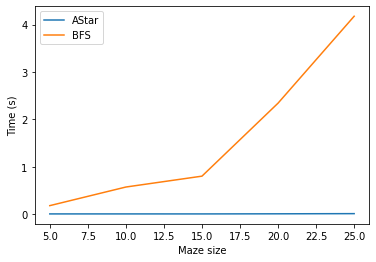

In [25]:
from matplotlib import pyplot as plt

plt.plot([5, 10, 15, 20, 25], aStarTime, label='AStar')
plt.plot([5, 10, 15, 20, 25], BFSTime, label='BFS')
plt.xlabel("Maze size")
plt.ylabel("Time (s)")
plt.legend()
plt.show()

The line chart above presented the comparison of A* and breadth-first search (BFS) algorithms for reaching a goal in mazes of different sizes. As the maze size increased, the time required for BFS to reach the goal also increased, indicating its inefficiency in larger environments. In contrast, the time taken by A* remained relatively consistent, suggesting its ability to efficiently navigate even larger mazes. These findings emphasize the advantage of A* over BFS in terms of time complexity when dealing with mazes of varying sizes.